# Telemetry Data for CI Clusters

Every cluster running an OpenShift CI job sends some operational data back to Red Hat via [Telemetry](https://docs.openshift.com/container-platform/4.7/support/remote_health_monitoring/about-remote-health-monitoring.html#telemetry-about-telemetry_about-remote-health-monitoring). This data gets stored as [Prometheus](https://prometheus.io/docs/introduction/overview/) metrics in a [Thanos](https://github.com/thanos-io/thanos) deployment at Red Hat. Some examples of the prometheus metrics collected here include CPU and memory capacity, operators installed, alerts fired, provider platform, etc. Thus, in addition to high level test run data on testgrid and prow, we also have detailed time series data available for the CI clusters that ran the tests.

In this notebook, we will show how to access this telemetry data using some open source tools developed by the AIOps team. Specifically we will show that, given a specific CI job run, how to get the telemetry data associated with the cluster that ran it. In addition, we will show how to get the pass/fail status of a given build of a job, from a given point in time. Then we will compare the telemetry metrics of a passing build with those of failing build within the same job, and see if we can get insights into the build failure.

**NOTE:** Since this data is currently hosted on a Red Hat internal Thanos, only those users with access to it will be able to run this notebook to get "live" data. To ensure that the wider open source community is also able to use this data for further analysis, we will use this notebook to extract a snippet of this data and save it on our public GitHub repo.

In [1]:
# import all the required libraries
import os
import warnings
import datetime as dt
from tqdm.notebook import tqdm
from dotenv import load_dotenv, find_dotenv
from urllib3.exceptions import InsecureRequestWarning
import requests

import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

from prometheus_api_client import (
    PrometheusConnect,
    MetricSnapshotDataFrame,
    MetricRangeDataFrame,
)

import sys

sys.path.insert(1, "../TestGrid/metrics")
from ipynb.fs.defs.metric_template import save_to_disk  # noqa: E402

load_dotenv(find_dotenv())

True

In [2]:
# config for a pretty notebook
sns.set()
load_dotenv(find_dotenv())
warnings.filterwarnings("ignore", category=InsecureRequestWarning)

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

# Data Access Setup

In this section, we will configure the [prometheus-api-client-python](https://github.com/AICoE/prometheus-api-client-python) tool to pull data from our Thanos instance. That is, set the value of `PROM_URL` to the Thanos endpoint, and set the value of `PROM_ACCESS_TOKEN` to the bearer token for authentication. We will also set the timestamp from which telemetry data is to be pulled.

In order to get access to the token, you can follow either one of these steps:
1. Visit `https://datahub.psi.redhat.com/`. Click on your profile (top right) and select Copy Login Command from the drop down menu. This will copy a command that will look something like: `oc login https://datahub.psi.redhat.com:443 --token=<YOUR_TOKEN>`. The value in YOUR_TOKEN is the required token.
2. From the command line, run `oc whoami --show-token`. Ensure that the output of `oc project` is `https://datahub.psi.redhat.com/`. This will output the required token.

**NOTE:** The above methods can only used if you are on Red Hat VPN.

In [3]:
# prometheus from which metrics are to be fetched
PROM_URL = os.getenv("PROM_URL")
PROM_ACCESS_TOKEN = os.getenv("PROM_ACCESS_TOKEN")

In [4]:
# prometheus connector object
pc = PrometheusConnect(
    url=PROM_URL,
    disable_ssl=True,
    headers={"Authorization": f"bearer {PROM_ACCESS_TOKEN}"},
)

In [5]:
# which metrics to fetch
# we will try to get all metrics, but leave out ones that may have potentially sensitive data
metrics_to_fetch = [
    m
    for m in pc.all_metrics()
    if "subscription" not in m and "internal" not in m and "url" not in m
]

In [6]:
# these fields are either irrelevant or contain something that could potentially be sensitive
# either way, these likely wont be useful for analysis anyway so exclude them when reading data
drop_cols = [
    "prometheus",
    "tenant_id",
    "endpoint",
    "instance",
    "receive",
    "url",
]

# Get All Data for Job Build

In this section, we will get all the prometheus metrics corresponding to a given job name, build id and fixed date. If you want to extract the information for another job name and build id, please ensure that [Thanos](https://telemeter-lts.datahub.redhat.com/graph) actually contains the data for this job/build at the corresponding timestamp at which you're evaluating the query. The job name and build id can be obtained either directly from the testgrid UI, or from the `query` and `changelists` fields respectively in the testgrid json as shown in the [testgrid metadata EDA notebook](../TestGrid/testgrid_metadata_EDA.ipynb).

One of the metrics stored in Thanos is `cluster_installer`. This metric describes what entity triggered the install of each cluster. For the clusters that run OpenShift CI jobs, the `invoker` label value in this metric is set to `openshift-internal-ci/{job_name}/{build_id}`.

Therefore, we can get all data for a given job build by first finding the ID of the cluster that ran it (using `cluster_installer`), and then querying prometheus for metrics where the `_id` label value equals this cluster ID. These steps are demonstrated through the example below. We will be choosing two jobs and build_id and later to compare their telemetry metric values. 

In [7]:
# timestamp for which prometheus queries will be evaluated
query_eval_time = dt.datetime(
    year=2022, month=1, day=18, hour=21, minute=53, second=51, tzinfo=dt.timezone.utc
)
query_eval_ts = query_eval_time.timestamp()

1642542831.0


In [8]:
# example job and build
job_name = "periodic-ci-openshift-release-master-nightly-4.10-e2e-aws-upgrade"

build_id_1 = "1483543721860403200"
build_id_2 = "1483543720656637952"

In [9]:
# get installer info for the job/build
job_build_cluster_installer1 = pc.custom_query(
    query=f'cluster_installer{{invoker="openshift-internal-ci/{job_name}/{build_id_1}"}}',
    params={"time": query_eval_ts},
)
job_build_cluster_installer2 = pc.custom_query(
    query=f'cluster_installer{{invoker="openshift-internal-ci/{job_name}/{build_id_2}"}}',
    params={"time": query_eval_ts},
)

# extract cluster id out of the installer info metric
cluster_id1 = job_build_cluster_installer1[0]["metric"]["_id"]
cluster_id2 = job_build_cluster_installer2[0]["metric"]["_id"]

# Overall Status

We are able to to get the status of past builds from the historical [testgrid](https://testgrid.k8s.io/) data that we are collecting. That is how we are calculating build pass/fail metrics over time. However, I am not sure if we are able to get the build_id from the Testgrid data. Hence, it makes more sense to get it from the prow logs. The overall status (pass/fail) of the past job and build id can be found in `finished.json` file in build log data ([example link](https://gcsweb-ci.apps.ci.l2s4.p1.openshiftapps.com/gcs/origin-ci-test/logs/release-openshift-ocp-installer-e2e-gcp-serial-4.2/1483551178997370880)). 

Here we are checking the status of the two job using prow log.

In [10]:
prow_log1 = requests.get(
    f"https://gcsweb-ci.apps.ci.l2s4.p1.openshiftapps.com"
    f"/gcs/origin-ci-test/logs/{job_name}/{build_id_1}/finished.json"
)

prow_log2 = requests.get(
    f"https://gcsweb-ci.apps.ci.l2s4.p1.openshiftapps.com"
    f"/gcs/origin-ci-test/logs/{job_name}/{build_id_2}/finished.json"
)

status1 = prow_log1.json()["result"]
status2 = prow_log2.json()["result"]

In [11]:
print(
    f"The status of the first build is {status1}"
    f" and the status of second build is {status2}."
)

The status of the first build is SUCCESS and the status of second build is FAILURE.


In the next step, we will calculate the metrics for the two builds. 

### Get One Metric

Before we fetch all the metrics, let's fetch just one metric and familiarize ourselves with the data format, and understand how to interpret it. In the cell below, we will look at an example metric, `cluster:cpu_capacity:sum`.

In [12]:
# fetch the metric and format it into a df
metric_df1 = MetricSnapshotDataFrame(
    pc.custom_query(
        query=f'cluster:capacity_cpu_cores:sum{{_id="{cluster_id1}"}}',
        params={"time": query_eval_ts},
    )
)

metric_df2 = MetricSnapshotDataFrame(
    pc.custom_query(
        query=f'cluster:capacity_cpu_cores:sum{{_id="{cluster_id2}"}}',
        params={"time": query_eval_ts},
    )
)

metric_df1.drop(columns=drop_cols, errors="ignore", inplace=True)
metric_df2.drop(columns=drop_cols, errors="ignore", inplace=True)

#### Metric for SUCCESS job

In [13]:
metric_df1

,__name__,_id,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,timestamp,value,label_node_role_kubernetes_io
0,cluster:capacity_cpu_cores:sum,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,m5.xlarge,amd64,rhcos,1642542831,12,NaN
1,cluster:capacity_cpu_cores:sum,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,m6i.xlarge,amd64,rhcos,1642542831,12,master


#### Metric for FAILED job

In [14]:
metric_df2

,__name__,_id,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,timestamp,value,label_node_role_kubernetes_io
0,cluster:capacity_cpu_cores:sum,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,m5.xlarge,amd64,rhcos,1642542831,12,NaN
1,cluster:capacity_cpu_cores:sum,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,m6i.xlarge,amd64,rhcos,1642542831,12,master


**HOW TO READ THIS DATAFRAME**

In the above dataframe, each column represents a "label" of the prometheus metric, and each row represents a different "label configuration". In this example, the first row has `label_node_role_kubernetes_io` = `NaN` and `value` = `12`, and the second row has `label_node_role_kubernetes_io` = `master` and `value` = `12`. This means that in this cluster, the `master` node had 12 CPU cores, and the `worker` node also had 12 CPU cores.

To learn more about labels, label configurations, and the prometheus data model in general, please check out their official documentation [here](https://prometheus.io/docs/concepts/data_model/).

Observing the above metrics value, we see that the value is 12 cores for both SUCCESS and FAILED build. 

# Get All Metrics

Now that we understand the data structure of the metrics, let's fetch all the metrics and concatenate them into one single dataframe.

## Metrics for testgrid SUCCESSFUL build

In [15]:
# let's combine all the metrics into one dataframe
# for the above mentioned job name and build name.

all_metrics_df = pd.DataFrame()
for metric in metrics_to_fetch:
    metric_df = MetricSnapshotDataFrame(
        pc.custom_query(
            query=f'{metric}{{_id="{cluster_id1}"}}',
            params={"time": query_eval_ts},
        )
    )
    if len(metric_df) > 0:
        metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)
        # print(f"Metric = {metric}")
        # display(metric_df.head())
        all_metrics_df = pd.concat(
            [
                all_metrics_df,
                metric_df,
            ],
            axis=0,
            join="outer",
            ignore_index=True,
        )
all_metrics_df.head(5)

,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value,container,job,mode,pod,service,apiserver,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,plugin_name,volume_mode,provisioner,networks,resource,type,region,invoker,version,condition,name,reason,from_version,image,code,metrics_path,exported_namespace,install_type,network_type,host_type,provider,client,status_code,quantile,exported_service,label_node_hyperthread_enabled,label_node_role_kubernetes_io_master
0,alerts,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,alerts,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,Watchdog,firing,openshift-monitoring,none,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cco_credentials_mode,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,openshift-cloud-credential-operator,NaN,1642542831,1,kube-rbac-proxy,cco-metrics,mint,cloud-credential-operator-784f994fff-lsxz8,cco-metrics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cluster:alertmanager_integrations:max,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,NaN,NaN,1642542831,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cluster:apiserver_current_inflight_requests:su...,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,NaN,NaN,1642542831,10,NaN,NaN,NaN,NaN,NaN,kube-apiserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
# concatenate into one dataframe
all_metricsdf1 = all_metrics_df.drop_duplicates()
all_metricsdf1.head()

,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value,container,job,mode,pod,service,apiserver,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,plugin_name,volume_mode,provisioner,networks,resource,type,region,invoker,version,condition,name,reason,from_version,image,code,metrics_path,exported_namespace,install_type,network_type,host_type,provider,client,status_code,quantile,exported_service,label_node_hyperthread_enabled,label_node_role_kubernetes_io_master
0,alerts,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,alerts,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,Watchdog,firing,openshift-monitoring,none,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cco_credentials_mode,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,openshift-cloud-credential-operator,NaN,1642542831,1,kube-rbac-proxy,cco-metrics,mint,cloud-credential-operator-784f994fff-lsxz8,cco-metrics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cluster:alertmanager_integrations:max,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,NaN,NaN,1642542831,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cluster:apiserver_current_inflight_requests:su...,59a54b9c-d0fd-4b1a-b119-c24fb08fa03c,NaN,NaN,NaN,NaN,1642542831,10,NaN,NaN,NaN,NaN,NaN,kube-apiserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Metrics for testgrid FAILURE build

In [17]:
# let's combine all the metrics into one dataframe
# for the above mentioned job name and build name.

all_metrics_df = pd.DataFrame()
for metric in metrics_to_fetch:
    metric_df = MetricSnapshotDataFrame(
        pc.custom_query(
            query=f'{metric}{{_id="{cluster_id2}"}}',
            params={"time": query_eval_ts},
        )
    )
    if len(metric_df) > 0:
        metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)
        all_metrics_df = pd.concat(
            [
                all_metrics_df,
                metric_df,
            ],
            axis=0,
            join="outer",
            ignore_index=True,
        )
all_metrics_df.head()

,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value,container,job,mode,pod,service,apiserver,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,plugin_name,volume_mode,provisioner,networks,resource,type,region,invoker,version,condition,name,reason,from_version,image,code,metrics_path,exported_namespace,install_type,network_type,host_type,provider,client,status_code,quantile,exported_service,label_node_hyperthread_enabled,label_node_role_kubernetes_io_master
0,alerts,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,alerts,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,Watchdog,firing,openshift-monitoring,none,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cco_credentials_mode,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,openshift-cloud-credential-operator,NaN,1642542831,1,kube-rbac-proxy,cco-metrics,mint,cloud-credential-operator-784f994fff-559g2,cco-metrics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cluster:alertmanager_integrations:max,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,NaN,NaN,1642542831,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cluster:apiserver_current_inflight_requests:su...,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,NaN,NaN,1642542831,24,NaN,NaN,NaN,NaN,NaN,kube-apiserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
all_metricsdf2 = all_metrics_df.drop_duplicates()
all_metricsdf2.head()

,__name__,_id,alertname,alertstate,namespace,severity,timestamp,value,container,job,mode,pod,service,apiserver,label_beta_kubernetes_io_instance_type,label_kubernetes_io_arch,label_node_openshift_io_os_id,label_node_role_kubernetes_io,plugin_name,volume_mode,provisioner,networks,resource,type,region,invoker,version,condition,name,reason,from_version,image,code,metrics_path,exported_namespace,install_type,network_type,host_type,provider,client,status_code,quantile,exported_service,label_node_hyperthread_enabled,label_node_role_kubernetes_io_master
0,alerts,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,AlertmanagerReceiversNotConfigured,firing,openshift-monitoring,warning,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,alerts,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,Watchdog,firing,openshift-monitoring,none,1642542831,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,cco_credentials_mode,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,openshift-cloud-credential-operator,NaN,1642542831,1,kube-rbac-proxy,cco-metrics,mint,cloud-credential-operator-784f994fff-559g2,cco-metrics,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cluster:alertmanager_integrations:max,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,NaN,NaN,1642542831,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,cluster:apiserver_current_inflight_requests:su...,026e1f8a-82af-4b42-8ed3-0f6af0d7ebea,NaN,NaN,NaN,NaN,1642542831,24,NaN,NaN,NaN,NaN,NaN,kube-apiserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Comparing some metrics for the SUCCESSFUL and FAILED build

In [19]:
# For SUCCESS build:
print(all_metricsdf1.__name__.nunique())
# For FAILED build:
print(all_metricsdf2.__name__.nunique())
print("The number of metrices extracted from the two builds are different.")

69
70
The number of metrices extracted from the two builds are different.


Furthermore, In the next steps, we merge the two datasets from the two builds and sort the merged dataframe with respect to the percentage difference in values of build metrics. Here, df1 corresponds to the dataframe for successful build type and df2 for failed build type.

### Percentage Difference:
$$ 
   D = \frac{|d_{1}-d_{2}|}{\frac{(d_{1}+d_{2})}{2}} \times 100  
$$

In [20]:
df1 = all_metricsdf1[["__name__", "value"]].drop_duplicates()
df1["value"] = df1["value"].astype(float)
df1 = df1.groupby(["__name__"])["value"].sum().to_frame()
df2 = all_metricsdf2[["__name__", "value"]].drop_duplicates()
df2["value"] = df2["value"].astype(float)
df2 = df2.groupby(["__name__"])["value"].sum().to_frame()

df1.rename(columns={"value": "Success_build_value"}, inplace=True)
df2.rename(columns={"value": "Failure_build_value"}, inplace=True)
df1 = df1.reset_index()
df2 = df2.reset_index()

In [21]:
df_merge = pd.merge(df1, df2, on="__name__", how="outer")
df_merge["diff"] = abs(
    ((df_merge["Success_build_value"] - df_merge["Failure_build_value"]) * 100)
    / ((df_merge["Success_build_value"] + df_merge["Failure_build_value"]) / 2)
)
df_merge = df_merge[
    ["__name__", "Success_build_value", "Failure_build_value", "diff"]
].sort_values(by="diff", ascending=False)

In [22]:
df_merge

,__name__,Success_build_value,Failure_build_value,diff
3,cluster:apiserver_current_inflight_requests:su...,1.300000e+01,2.900000e+01,76.190476
51,instance:etcd_disk_backend_commit_duration_sec...,2.132312e-02,1.381915e-02,42.706215
56,instance:etcd_object_counts:sum,2.470200e+04,3.762300e+04,41.463297
55,instance:etcd_network_peer_round_trip_time_sec...,3.778560e-02,2.521600e-02,39.902479
22,cluster:usage:openshift:ingress_request_total:...,3.400000e+00,4.466667e+00,27.118644
63,openshift:cpu_usage_cores:sum,2.572576e+00,3.335502e+00,25.826554
6,cluster:cpu_usage_cores:sum,2.574476e+00,3.337539e+00,25.813958
60,namespace_job:scrape_series_added:topk3_sum1h,2.363220e+05,3.037350e+05,24.965143
18,cluster:usage:ingress_frontend_connections:sum,1.900000e+01,2.300000e+01,19.047619
25,cluster:usage:workload:capacity_physical_cpu_c...,9.852000e+03,1.149000e+04,15.350014


In the next case, we are plotting some metrics values listed in the metric_list below. Using the plot we are able to compare the value for both successful and failed build types.  

In [23]:
metric_list = df_merge.__name__.iloc[:5]
metric_list

3     cluster:apiserver_current_inflight_requests:su...
51    instance:etcd_disk_backend_commit_duration_sec...
56                      instance:etcd_object_counts:sum
55    instance:etcd_network_peer_round_trip_time_sec...
22    cluster:usage:openshift:ingress_request_total:...
Name: __name__, dtype: object

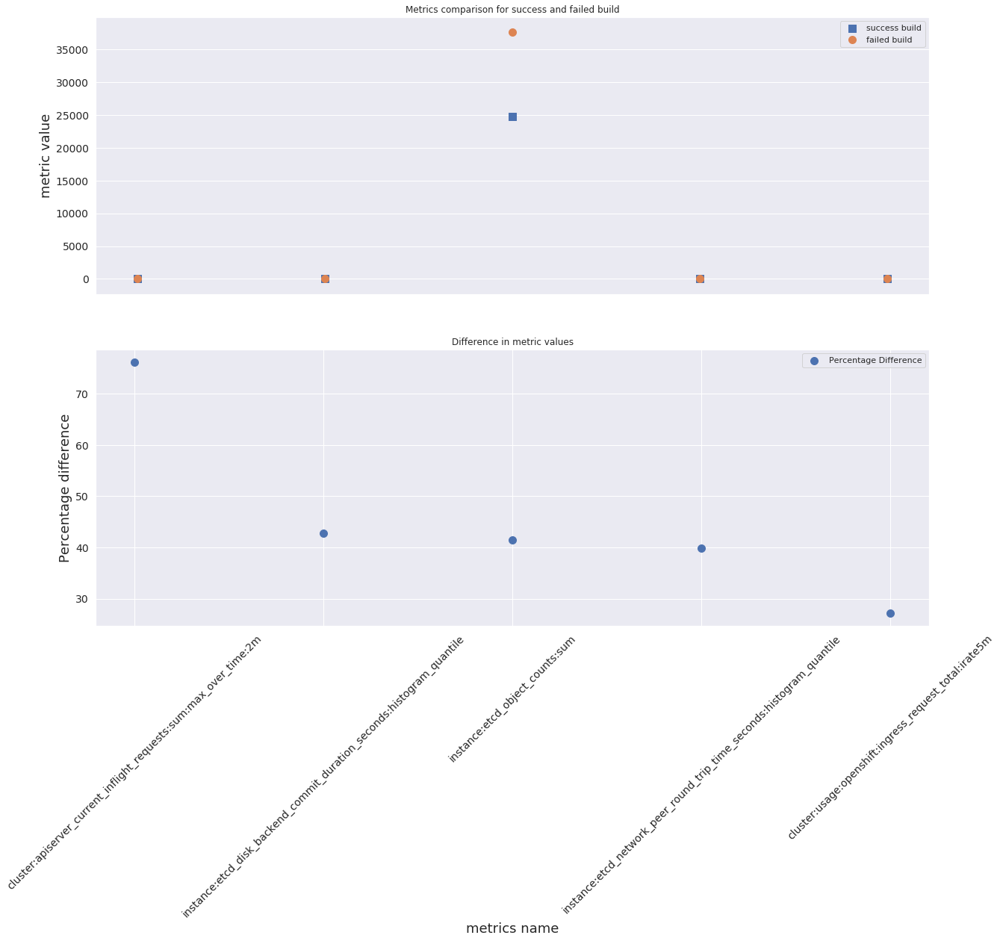

In [24]:
filter_series1 = df_merge.__name__.isin(metric_list)
df_mergef = df_merge[filter_series1]

plt.figure(figsize=(20, 15))

plt.subplot(2, 1, 1)
plt.scatter(
    df_mergef["__name__"],
    df_mergef["Success_build_value"],
    label="success build",
    marker="s",
    s=100,
)
plt.scatter(
    df_mergef["__name__"],
    df_mergef["Failure_build_value"],
    label="failed build",
    marker="o",
    s=100,
)
plt.title("Metrics comparison for success and failed build")
plt.ylabel("metric value", fontsize=18)
plt.xticks([])
plt.yticks(fontsize=14)
plt.legend()

plt.subplot(2, 1, 2)
plt.scatter(
    df_mergef["__name__"],
    df_mergef["diff"],
    label="Percentage Difference",
    marker="o",
    s=100,
)
plt.title("Difference in metric values")
plt.xlabel("metrics name", fontsize=18)
plt.ylabel("Percentage difference", fontsize=18)
plt.xticks(fontsize=14, rotation=45)
plt.yticks(fontsize=14)
plt.legend()

In [25]:
df_mergef

,__name__,Success_build_value,Failure_build_value,diff
3,cluster:apiserver_current_inflight_requests:su...,13.000000,29.000000,76.190476
51,instance:etcd_disk_backend_commit_duration_sec...,0.021323,0.013819,42.706215
56,instance:etcd_object_counts:sum,24702.000000,37623.000000,41.463297
55,instance:etcd_network_peer_round_trip_time_sec...,0.037786,0.025216,39.902479
22,cluster:usage:openshift:ingress_request_total:...,3.400000,4.466667,27.118644


We plotted the metric values from the above table along with their respective percentage difference. Even though we do see from the plots that some point for success and failed build are overlapping. The percentage difference plot clarifies that the two are different and not of same value. 

# Get Data for Multiple Builds for a Given Job

In this section, we will fetch all the telemetry metrics from all timestamps for the top 10 most recent builds for a given job. This data can help understand how the behavior of the available metrics changed over time, across builds.

In [26]:
# fetch data from this number of builds for this job
NBUILDS = 10

# number of previous days of data to search to get the last n builds data for this job
NDAYS = 2

# max runtime of a build
# NOTE: this is a (over)estimate number derived from SME conversations, as well as time duration from testgrid
MAX_DURATION_HRS = 12

In [27]:
# get invoker details
prev_ndays_invokers = MetricRangeDataFrame(
    pc.custom_query_range(
        query=f'max by (_id, invoker) (cluster_installer{{invoker=~"^openshift-internal-ci/{job_name}.*"}})',
        end_time=query_eval_time,
        start_time=query_eval_time - dt.timedelta(days=NDAYS),
        step="5m",
    )
).sort_index()

# split invoker name into prefix, job id, build id.
prev_ndays_invokers[["prefix", "job_name", "build_id"]] = prev_ndays_invokers[
    "invoker"
].str.split("/", expand=True)

# drop now redundant columns.
prev_ndays_invokers.drop(columns=["invoker", "prefix", "value"], inplace=True)

# drop irrelevant columns.
prev_ndays_invokers.drop(columns=drop_cols, errors="ignore", inplace=True)

prev_ndays_invokers.head()

,_id,job_name,build_id
timestamp,,,
1642388700,e249fcab-e322-462c-bfbd-6f9cf96a598b,periodic-ci-openshift-release-master-nightly-4...,1482905366760001536
1642388700,740192b4-71f1-490d-90d9-0d494c7d2e17,periodic-ci-openshift-release-master-nightly-4...,1482905366944550912
1642388700,029b1b45-1ecf-4e9b-b36e-59bc5af9a329,periodic-ci-openshift-release-master-nightly-4...,1482905366688698368
1642389000,474c0eef-6bef-47ed-b400-1b173f5f4633,periodic-ci-openshift-release-master-nightly-4...,1482905366797750272
1642389000,740192b4-71f1-490d-90d9-0d494c7d2e17,periodic-ci-openshift-release-master-nightly-4...,1482905366944550912


In [28]:
# for each build, get cluster id and then the corresponding metrics from all timestamps
all_metrics_df = pd.DataFrame()

for build_id in tqdm(prev_ndays_invokers["build_id"].unique()[:NBUILDS]):

    job_build_cluster_installer = pc.custom_query_range(
        query=f'cluster_installer{{invoker="openshift-internal-ci/{job_name}/{build_id}"}}',
        end_time=query_eval_time,
        start_time=query_eval_time
        - dt.timedelta(days=NDAYS)
        - dt.timedelta(days=MAX_DURATION_HRS),
        step="5m",
    )

    # extract cluster id out of the installer info metric
    cluster_id = job_build_cluster_installer[0]["metric"]["_id"]

    # get all telemetry time series
    for metric in metrics_to_fetch:

        # fetch the metric
        metric_result = pc.custom_query_range(
            query=f'{metric}{{_id="{cluster_id}"}}',
            end_time=query_eval_time,
            start_time=query_eval_time
            - dt.timedelta(days=NDAYS)
            - dt.timedelta(days=MAX_DURATION_HRS),
            step="5m",
        )

        if len(metric_result) > 0:
            metric_df = MetricRangeDataFrame(metric_result).reset_index(drop=False)

            # drop irrelevant cols, if any
            metric_df.drop(columns=drop_cols, errors="ignore", inplace=True)

            # combine all the metrics data.
            all_metrics_df = pd.concat(
                [
                    all_metrics_df,
                    metric_df,
                ],
                axis=0,
                join="outer",
                ignore_index=True,
            )

all_metrics_df["value"] = all_metrics_df["value"].astype(float)

  0%|          | 0/10 [00:00<?, ?it/s]

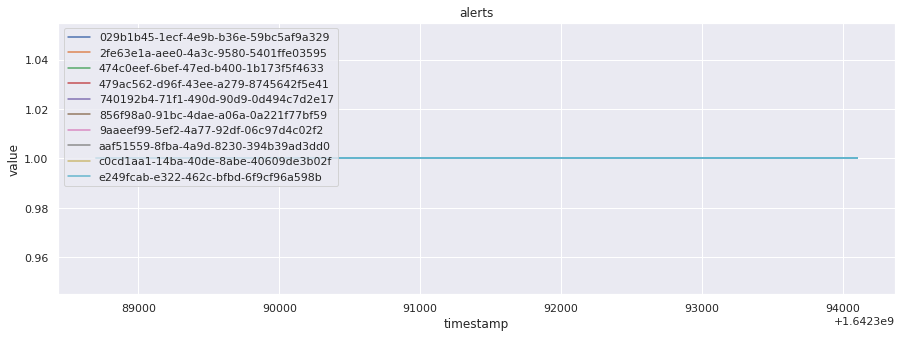

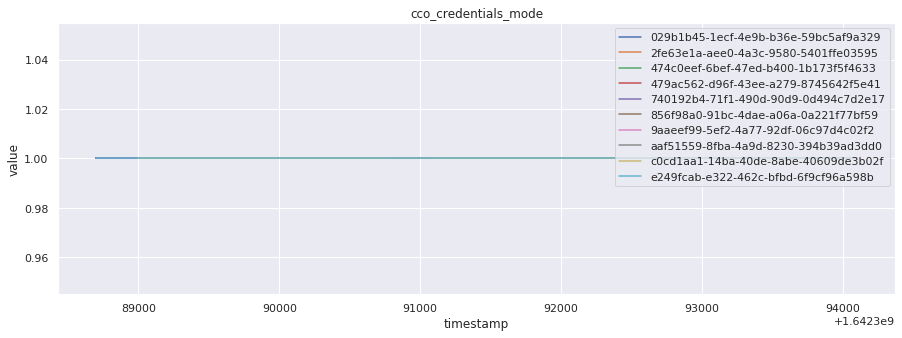

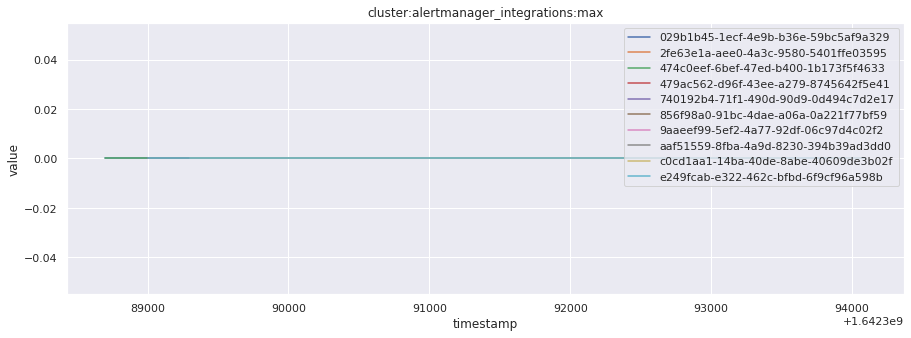

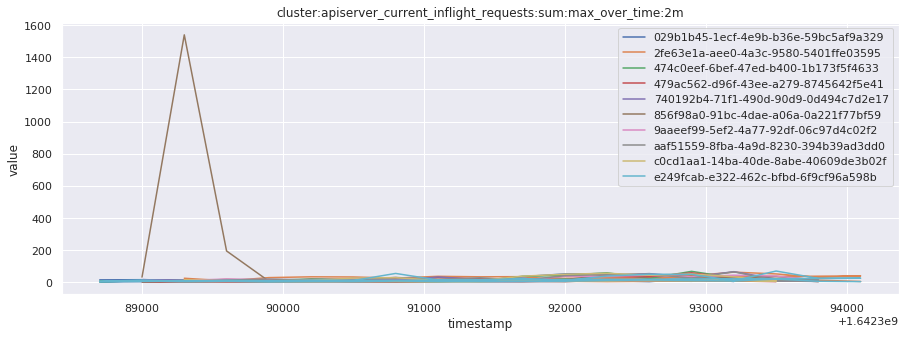

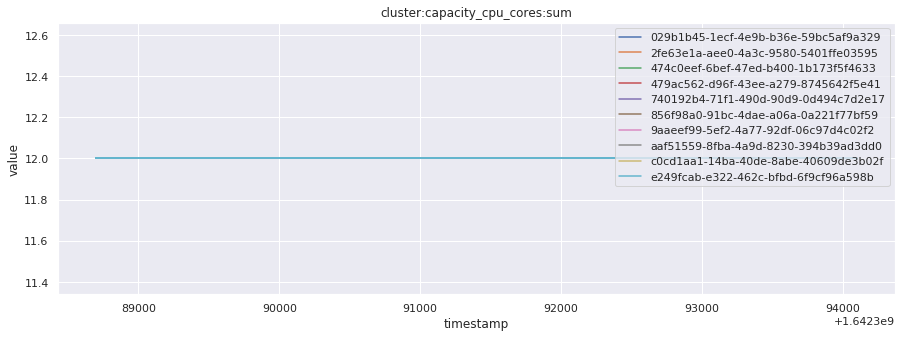

...

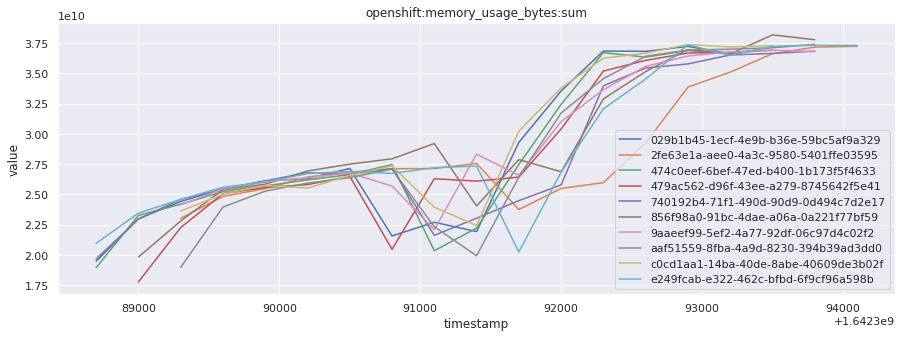

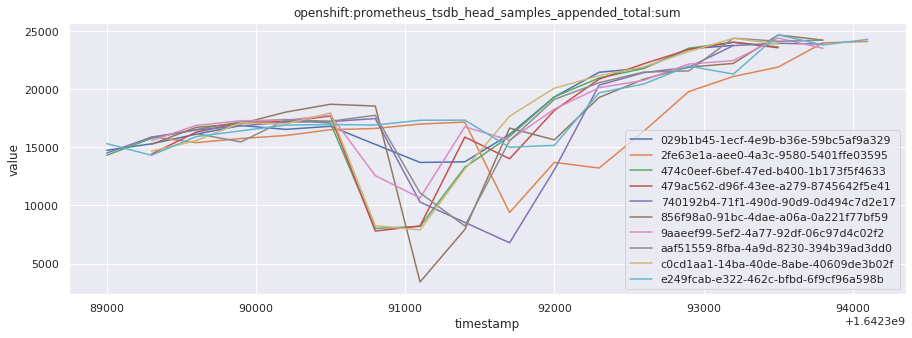

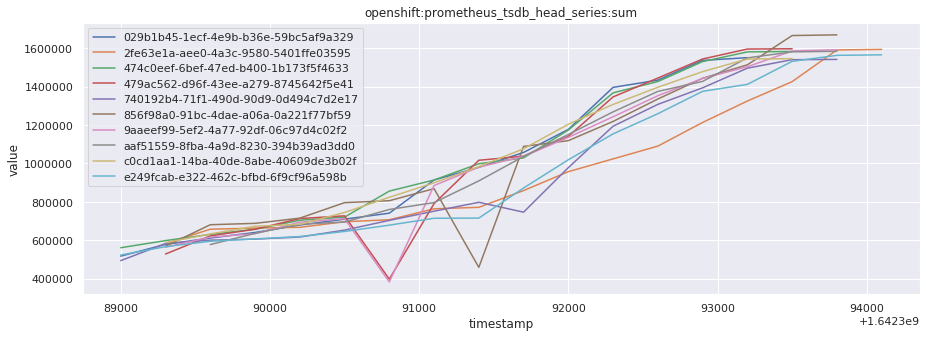

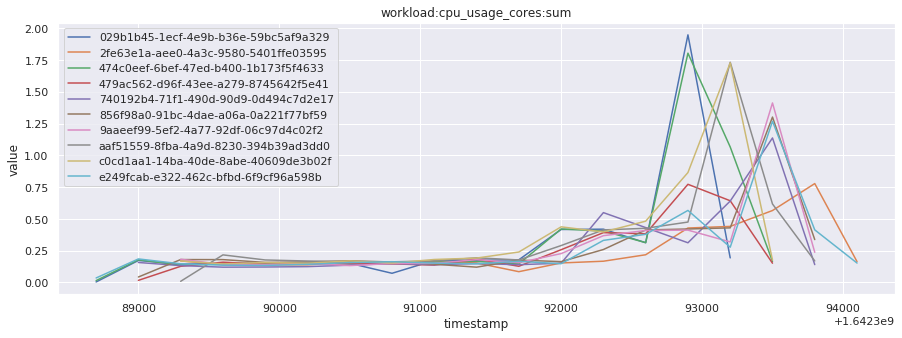

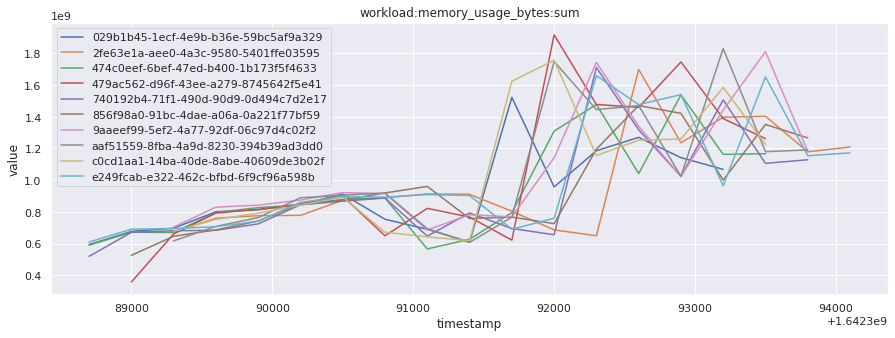

In [29]:
# visualize time series behavior across builds
for metric in all_metrics_df["__name__"].unique():
    plt.figure(figsize=(15, 5))

    metric_df = all_metrics_df[all_metrics_df["__name__"] == metric][
        ["_id", "timestamp", "value"]
    ]
    metric_df.set_index("timestamp").groupby("_id").value.plot(legend=True)

    plt.xlabel("timestamp")
    plt.ylabel("value")
    plt.legend(loc="best")
    plt.title(metric)
    plt.show()

In [30]:
# save the metrics as a static dataset to use in future
save_to_disk(
    all_metrics_df,
    "../../../data/raw/",
    f"telemetry-{query_eval_time.year}-{query_eval_time.month}-{query_eval_time.day}.parquet",
)

True

## Conclusion

In this notebook, we have :
- Checked the status of (pass/fail) builds of corresponding job.
- Collected all telemetry data corresponding to a given job and build.
- Compared the telemetry data for both SUCCESSFUL and FAILED builds of corresponding job.
- Understood how to interpret Prometheus data using an example metric.
- Collected all telemetry data from all timestamps for the top 10 most recent builds for a given job.
- Visualized what the general time series behavior of metrics looks like across builds.
- Saved the above data for further analysis.